In [1]:
import numpy as np
import pandas as pd
import io
from time import strptime, strftime
import datetime
import re
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy.stats 
import seaborn as sns
import plotly.graph_objects as go
import contextily as ctx 
import geopandas as gpd 
import folium
import mapclassify as mc
pd.set_option('max_rows', 1000)
pd.set_option('max_columns', 1000)

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]

In [2]:
df_bmi_og = pd.read_excel(r'bmi_deidentified.xlsx')

In [5]:
# # Commonly used

# df_bmi_og[df_bmi_og['ZIP_CODE'] == '719']

# # to use the index position, use .loc (as opposed to .iloc)
# #df_bmi_og['ZIP_CODE'].loc[56190]

# # drop values from the whole table based on column values that are NaN
# df_bmi_mod.dropna(subset=['ZIP_CODE'], inplace=True)

# # check if any NaN are present and return the table where there's NaN
# df_bmi_mod[df_bmi_mod['BMI'].isna()]

# bmi_zip_group = df_bmi_zip.groupby(['ZIP_CODE'])
# bmi_zip_group.describe()


In [3]:
#BMI dataset cleaning
df_bmi_mod = df_bmi_og.copy()
# drop rows where zip code is missing (NaN)
df_bmi_mod.dropna(subset=['ZIP_CODE'], inplace=True)

# drop the decimal from zip code, make it a string to match the census map
df_bmi_mod['ZIP_CODE'] = df_bmi_mod['ZIP_CODE'].apply(lambda x: str(int(x)))

# remove zip codes entered less than 5 digits
df_bmi_mod = df_bmi_mod[df_bmi_mod['ZIP_CODE'].str.len() == 5]

# real way to omit outliers as BMIs 3 STdevs above the mean (real real is 3)
# From 93464 to 83199 (also removes NaN BMI)
df_bmi_mod = df_bmi_mod[np.abs(scipy.stats.zscore(df_bmi_mod['BMI'], nan_policy='omit'))<3]

# if we just keep low enough values (arbitrary) also excludes NaN, saves ~300 samples
# 83523
# df_bmi_mod = df_bmi_mod[df_bmi_mod['BMI'] < 200]

In [4]:
# only the BMI data from the df above (can save this and put on github?)
df_bmi_zip = df_bmi_mod[['ZIP_CODE', 'BMI']]

In [5]:
#aggregate the bmi data by zip code
bmi_zip_group = df_bmi_zip.groupby(['ZIP_CODE'])
#"summary" calculates mean, stdev, quartiles
bmi_zip_group_summary = bmi_zip_group.describe()
# to remove single counts (can do this inline with merging):  bmi_zip_group_summary[bmi_zip_group_summary['BMI','count'] > 1]

# not necessary
# bmi_zip_group_summary.reindex() # sorts based on index (Zip Code)

#makes new normally numbered index and moves zip code to new column (helps for joining?)
bmi_zip_group_summary.reset_index(inplace = True) 

# state or country.
# For merging later, Tx map is from 2010 census,
# country map is from 2020, want column names to match
# unsure if geopandas has left_on and right_on option and too lazy to experiment
state_level = 'ZCTA5CE10'
country_level = 'ZCTA5CE20'

# remove 2 tier column names and replace
bmi_zip_group_summary.columns = [state_level, 'BMI_count', 'BMI_mean', 'BMI_std', 'BMI_min', 
                                 'BMI_25%', 'BMI_50%', 'BMI_75%', 'BMI_max']

# pandas is generous with the sig figs
bmi_zip_group_summary = bmi_zip_group_summary.round(2)

# Country Wide Map
### Interactive

In [6]:
bmi_zip_group_summary.rename(columns={"ZCTA5CE10" : "ZCTA5CE20"}, inplace=True)

df_map_country = gpd.read_file("tl_2021_us_zcta520.shp")

country_merge = df_map_country.merge(bmi_zip_group_summary[bmi_zip_group_summary['BMI_count'] > 1], how='outer', on=country_level)

In [7]:
int_map = country_merge[(country_merge['BMI_count'] > 10) 
                               & (country_merge['geometry'] != None)].explore(
    column='BMI_mean', legend=True, cmap='plasma', scheme='UserDefined',
                         missing_kwds= dict(color = (0.87, 0.87, 0.87), 
                                            edgecolor='white', linewidth = 0.1), 
                         legend_kwds={'caption':"Avg BMI", 'colorbar':False,"fmt": "{:.2f}",},
                        tooltip=["ZCTA5CE20", "BMI_mean", "BMI_std", "BMI_count"],
                        classification_kwds={'bins':[20,25,30,35,40]})


title_text = 'Interactive Avg BMI in Zip Code for N > 10'
title_html = '''
             <h3 align="center" style="font-size:22px"><b>{}</b></h3>
             '''.format(title_text) 
int_map.get_root().html.add_child(folium.Element(title_html))

In [174]:
int_map

In [175]:
int_map.save('bmi_zip_interactive.html')

Text(0.5, 1.0, 'Avg BMI by Zip Code with Count > 1 Country')

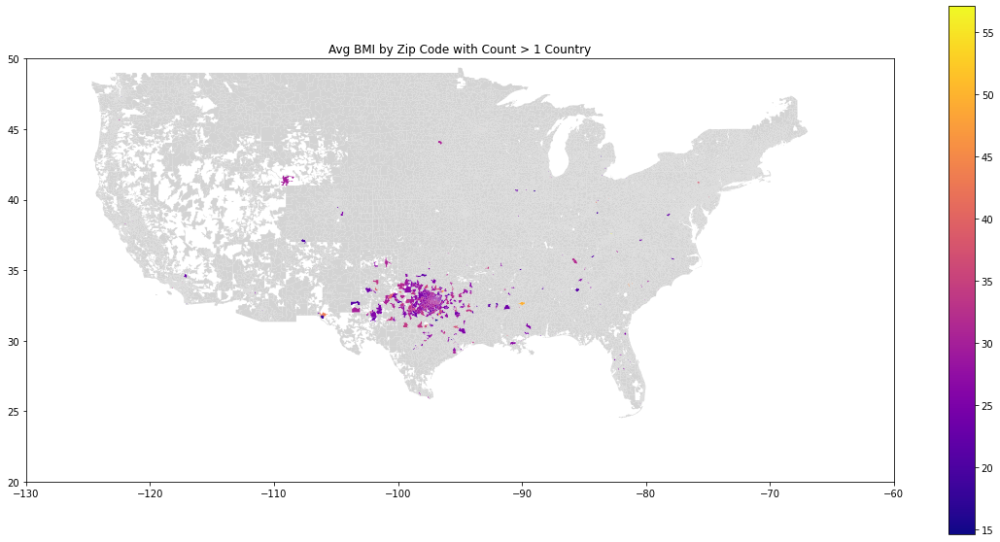

In [39]:
fig, ax = plt.subplots(1, 1)

country_merge.plot(column='BMI_mean',  ax=ax, legend=True, cmap='plasma',missing_kwds= dict(color = 'lightgrey'))
                #missing_kwds= dict(color = (0.87, 0.87, 0.87), edgecolor='white', linewidth = 0.1), legend_kwds={'label': "Avg BMI",});
plt.xlim((-130,-60))
plt.ylim((20, 50))
plt.title('Avg BMI by Zip Code with Count > 1 Country')
#ax.set_axis_off()
#fig.set_size_inches(10.5, 10.5)
#plt.savefig('Texas_avg_BMI.jpg', transparent=False, format='jpg', dpi=500)

## State Specific (Old)

In [1]:

# just to show the 2010 texas map
# df_map_state.plot()

# state level is from 2010 so zip code column is named different
# df_map_state = gpd.read_file("tl_2010_48_zcta510.shp")
#df = df_map.to_crs("EPSG:4326")
# state_merge = df_map_state.merge(bmi_zip_group_summary[bmi_zip_group_summary['BMI_count'] > 1], how='outer', on='ZCTA5CE10')

# %store state_merge

### Static plot

In [2]:
# fig, ax = plt.subplots(1, 1)

# state_merge[state_merge['BMI_count'] > 30].plot(column='BMI_mean',  ax=ax, legend=True, cmap='plasma',
#                 missing_kwds= dict(color = (0.87, 0.87, 0.87), edgecolor='white', linewidth = 0.1), legend_kwds={'label': "Avg BMI",});
# #plt.xlim((-150,-50))
# #plt.ylim((10, 70))
# plt.title('Avg BMI by Zip Code with Count > 1 (Tx Only)')
# ax.set_axis_off()
# fig.set_size_inches(10.5, 10.5)
# #plt.savefig('Texas_avg_BMI.jpg', transparent=False, format='jpg', dpi=500)

### Interactive plot

In [3]:
# # subset with BMI count > 10 in that zipcode, also make sure the zipcode has a "geometry" otherwise, will .plot but not .explore (interactive)
# # tooltip adjusts which column info is shown on hover
# state_merge[(state_merge['BMI_count'] > 10) 
#                                & (state_merge['geometry'] != None)].explore(
#     column='BMI_mean', legend=True, cmap='plasma', 
#                          missing_kwds= dict(color = (0.87, 0.87, 0.87), 
#                                             edgecolor='white', linewidth = 0.1), 
#                          legend_kwds={'label': "Avg BMI",},
#                         tooltip=["ZCTA5CE10", "BMI_count","BMI_mean", "BMI_std"])

In [ ]:
# tarrant_co_zips = [75052,76063,76028,76244,76179,76116,76137,76051,76133,76010,76108,76039,76112,76017,76107,76131,76262,75050,76021,76119,76180,76248,76013,76006,76132,75051,76123,76020,76053,76040,76182,76036,76109,76016,76117,7601,76001,76011,76012,76110,76106,76114,76126,76140,76092,76002,76177,76034,76052,76134,76018,75022,76104,76148,76008,76120,76135,76105,76111,76015,76115,76022,75054,76118,76102,76103,76054,76164,76155,76060,76005,76096,76003,76161,76095,7608,76099,76162,76124,76185,76121,76004,76163,76136,76147,76101,76007,75261,76094,76127,76181,76113,76019,76122,76130,76129,76150,76192,76191,76195,76193,76197,76196,76199,76198,75099,75368,76190,76166]

# bmi_zip_group_summary